In [1]:
import os
import math
import glob
import torch
import random
import numpy as np
import pandas as pd
import torch.nn as nn
from PIL import Image
from tqdm.auto import tqdm
from torch.optim import Adam
from torchinfo import summary
from torchvision.transforms import v2
from torch.amp import autocast, GradScaler
from torch.optim.lr_scheduler import StepLR
from torch.utils.data import Dataset, DataLoader
from torchmetrics.image import PeakSignalNoiseRatio
from torchmetrics.image import StructuralSimilarityIndexMeasure
from torchmetrics.image.lpip import LearnedPerceptualImagePatchSimilarity

In [2]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [3]:
HR_train_paths = sorted(glob.glob("../data/DIV2K_train_HR/*.png"))
X2_train_paths = sorted(glob.glob("../data/DIV2K_train_LR_bicubic/X2/*.png"))
X4_train_paths = sorted(glob.glob("../data/DIV2K_train_LR_bicubic/X4/*.png"))
X8_train_paths = sorted(glob.glob("../data/DIV2K_train_LR_bicubic/X8/*.png"))
X16_train_paths = sorted(glob.glob("../data/DIV2K_train_LR_bicubic/X16/*.png"))
X32_train_paths = sorted(glob.glob("../data/DIV2K_train_LR_bicubic/X32/*.png"))
X64_train_paths = sorted(glob.glob("../data/DIV2K_train_LR_bicubic/X64/*.png"))

HR_valid_paths = sorted(glob.glob("../data/DIV2K_valid_HR/*.png"))
X2_valid_paths = sorted(glob.glob("../data/DIV2K_valid_LR_bicubic/X2/*.png"))
X4_valid_paths = sorted(glob.glob("../data/DIV2K_valid_LR_bicubic/X4/*.png"))
X8_valid_paths = sorted(glob.glob("../data/DIV2K_valid_LR_bicubic/X8/*.png"))
X16_valid_paths = sorted(glob.glob("../data/DIV2K_valid_LR_bicubic/X16/*.png"))
X32_valid_paths = sorted(glob.glob("../data/DIV2K_valid_LR_bicubic/X32/*.png"))
X64_valid_paths = sorted(glob.glob("../data/DIV2K_valid_LR_bicubic/X64/*.png"))

## Model and data preparation

## SRResNet

The architecture below is described in this [paper](https://arxiv.org/pdf/1609.04802)

In [4]:
class ResBlock(nn.Module):
        def __init__(self):
            super().__init__()
            self.block = nn.Sequential(
                nn.Conv2d(64, 64, 3, stride=1, padding='same'),
                nn.BatchNorm2d(64),
                nn.PReLU(),
                nn.Conv2d(64, 64, 3, stride=1, padding='same'),
                nn.BatchNorm2d(64)
            )

        def forward(self, x):
            return x + self.block(x)

class SRResNet(nn.Module):
    def __init__(self, n: int):
        """
        Args:
            n: scaling factor
        """
        super().__init__()
        
        self.expand = nn.Sequential(
            nn.Conv2d(3, 64, 9, stride=1, padding='same'),
            nn.PReLU()
        )

        self.residual_blocks = nn.Sequential()
        for _ in range(16):
            self.residual_blocks.append(ResBlock())

        self.residual_blocks.append(nn.Conv2d(64, 64, 3, stride=1, padding='same'))
        self.residual_blocks.append(nn.BatchNorm2d(64))

        self.upscaling_head = nn.Sequential()
        for _ in range(int(math.log2(n))):
            self.upscaling_head.append(nn.Conv2d(64, 256, 3, stride=1, padding='same'))
            self.upscaling_head.append(nn.PixelShuffle(2))
            self.upscaling_head.append(nn.PReLU())
            
        self.upscaling_head.append(nn.Conv2d(64, 3, 9, stride=1, padding='same'))

    def forward(self, x):
        x = self.expand(x)
        return self.upscaling_head(self.residual_blocks(x) + x)

In [5]:
summary(SRResNet(8), input_size=(16, 3, 48, 48))

Layer (type:depth-idx)                   Output Shape              Param #
SRResNet                                 [16, 3, 384, 384]         --
├─Sequential: 1-1                        [16, 64, 48, 48]          --
│    └─Conv2d: 2-1                       [16, 64, 48, 48]          15,616
│    └─PReLU: 2-2                        [16, 64, 48, 48]          1
├─Sequential: 1-2                        [16, 64, 48, 48]          --
│    └─ResBlock: 2-3                     [16, 64, 48, 48]          --
│    │    └─Sequential: 3-1              [16, 64, 48, 48]          74,113
│    └─ResBlock: 2-4                     [16, 64, 48, 48]          --
│    │    └─Sequential: 3-2              [16, 64, 48, 48]          74,113
│    └─ResBlock: 2-5                     [16, 64, 48, 48]          --
│    │    └─Sequential: 3-3              [16, 64, 48, 48]          74,113
│    └─ResBlock: 2-6                     [16, 64, 48, 48]          --
│    │    └─Sequential: 3-4              [16, 64, 48, 48]          74,

In [5]:
class SRResNet_Dataset(Dataset):
    def __init__(self, target_paths: list[str], scale: int, ram_limit_gb: float = 2.0):
        self.crop_size = scale * 48
        self.scale = scale

        self.input_transform = v2.Compose([
            v2.PILToTensor(),
            v2.Lambda(lambda x: x / 255.0)
        ])
        
        self.target_transform = v2.Compose([
            v2.PILToTensor(),
            v2.Lambda(lambda x: (2.0*x / 255.0) - 1)
        ])

        self.preloaded = {}
        self.paths = target_paths

        total_ram_used = 0
        for i, path in enumerate(tqdm(target_paths, desc="Preloading images")):
            img = Image.open(path).convert("RGB")
            total_ram_used += img.width * img.height * 3 / (1024 ** 3)  # ~size in GB

            if total_ram_used < ram_limit_gb:
                self.preloaded[i] = img
            else:
                break

    def __len__(self):
        return len(self.paths)

    def __getitem__(self, idx):
        if idx in self.preloaded:
            target = self.preloaded[idx]
        else:
            target = Image.open(self.paths[idx]).convert("RGB")

        target = self.random_crop(target, self.crop_size)
        inp = target.resize((target.width // self.scale, target.height // self.scale), Image.BICUBIC)
            
        return self.input_transform(inp), self.target_transform(target)

    def random_crop(self, img, size):
        w, h = img.size
        if w < size or h < size:
            img = img.resize((size, size), Image.BICUBIC)
        x = random.randint(0, w - size)
        y = random.randint(0, h - size)
        return img.crop((x, y, x + size, y + size))

    def set_scale(self, scale: int):
        self.scale = scale

    def set_crop_size(self, crop_size: int):
        self.crop_size = crop_size

In [6]:
psnr = PeakSignalNoiseRatio(data_range=1.0).to(device)
ssim = StructuralSimilarityIndexMeasure(data_range=1.0).to(device)
lpips = LearnedPerceptualImagePatchSimilarity(normalize=True).to(device)

In [7]:
transform = v2.Compose([
    v2.PILToTensor(),
    v2.Lambda(lambda x: x / 255.0)
])

In [8]:
def calc_metrics(model: nn.Module, target_ds: list[str], scale: int):
    transform = v2.Compose([
        v2.PILToTensor(),
        v2.Lambda(lambda x: x / 255.0)
    ])

    psnr_acc = 0
    ssim_acc = 0
    lpips_acc = 0
    failed_lpips = 0

    for i in tqdm(range(len(target_ds)), leave=False):
        target_image = Image.open(target_ds[i]).convert("RGB")
        w, h = target_image.size

        w -= w % scale
        h -= h % scale
        target_image = target_image.crop((0, 0, w, h))
        
        lowres = target_image.resize((w // scale, h // scale), resample=Image.BICUBIC)
        input_tensor = transform(lowres).unsqueeze(0).to(device)
        target_tensor = transform(target_image).unsqueeze(0).to(device)

        with torch.inference_mode():
            # convert value range [-1,1] -> [0,1]
            sr = ((model(input_tensor)+1.0)/2.0).clamp(0.0, 1.0)

        psnr_acc += psnr(sr, target_tensor).item()
        ssim_acc += ssim(sr, target_tensor).item()
        
        # There are 2 images that cause lpips to fail
        try:
            x = lpips(sr, target_tensor).cpu().item()
            if np.isnan(x):
                failed_lpips += 1
                continue
                
            lpips_acc += x
        except:
            failed_lpips += 1

    lpips_acc /= len(target_ds) - failed_lpips
    psnr_acc /= len(target_ds)
    ssim_acc /= len(target_ds)
    return psnr_acc, ssim_acc, lpips_acc

In [9]:
def train_step(model, dataloader, optimizer, loss_fn, scaler):
    avg_psnr = 0
    avg_ssim = 0
    model.train()

    for batch, target in dataloader:
        optimizer.zero_grad(set_to_none=True)
        batch, target = batch.to(device), target.to(device)

        with autocast('cuda'):
            logits = model(batch)
            loss = loss_fn(logits, target)

        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()

        # convert value range [-1,1] -> [0,1]
        logits = ((logits+1.0)/2.0).clamp(0.0, 1.0)
        target = ((target+1.0)/2.0).clamp(0.0, 1.0)
        
        avg_psnr += psnr(logits, target).item()
        avg_ssim += ssim(logits, target).item()
        
    avg_psnr /= len(dataloader)
    avg_ssim /= len(dataloader)
    return avg_psnr, avg_ssim

def valid_step(model, dataloader, loss_fn):
    avg_psnr = 0
    avg_ssim = 0
    avg_lpips = 0
    model.eval()

    with torch.inference_mode():
        for batch, target in dataloader:
            batch, target = batch.to(device), target.to(device)

            # convert [-1,1] -> [0,1]
            logits = ((model(batch)+1.0)/2.0).clamp(0.0, 1.0)
            target = ((target+1.0)/2.0).clamp(0.0, 1.0)
            
            avg_psnr += psnr(logits, target).item()
            avg_ssim += ssim(logits, target).item()
            avg_lpips += lpips(logits, target).item()

    avg_psnr /= len(dataloader)
    avg_ssim /= len(dataloader)
    avg_lpips /= len(dataloader)


    return avg_psnr, avg_ssim, avg_lpips

In [10]:
def train(model, train_dl, valid_dl, optimizer, scheduler: StepLR, loss_fn, epochs, start_checkpoint=None):
    os.makedirs('../tmp_model_checkpoints', exist_ok=True)
    counter = 0 # count epochs without printing training stats
    scaler = GradScaler('cuda')
    
    if start_checkpoint:
        start_epoch = start_checkpoint['epoch'] + 1
        best_psnr = start_checkpoint['best_psnr']
        best_ssim = start_checkpoint['best_ssim']
        best_lpips = start_checkpoint['best_lpips']
        scaler.load_state_dict(start_checkpoint['scaler_state_dict'])
    else:
        start_epoch = 0
        best_psnr = 0
        best_ssim = 0
        best_lpips = float('inf')
        
    log_freq = (epochs - start_epoch) // 100 # how often to print stats when no progress is made
    
    for epoch in tqdm(range(start_epoch, epochs), desc="Epochs"):
        counter += 1
        train_psnr, train_ssim = train_step(
            model,
            train_dl,
            optimizer,
            loss_fn,
            scaler
        )

        valid_psnr, valid_ssim, valid_lpips = valid_step(
            model,
            valid_dl,
            loss_fn,
        )

        scheduler.step()

        progress = False
        
        if valid_psnr > best_psnr:
            progress = True
            best_psnr = valid_psnr
            checkpoint = {
                'epoch': epoch,
                'best_psnr': best_psnr,
                'best_ssim': best_ssim,
                'best_lpips': best_lpips,
                'model_state_dict':  model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                'scheduler_state_dict': scheduler.state_dict(),
                'scaler_state_dict': scaler.state_dict()
            }
            torch.save(checkpoint, f'../tmp_model_checkpoints/best_psnr.pth')

        if valid_ssim > best_ssim:
            progress = True
            best_ssim = valid_ssim
            checkpoint = {
                'epoch': epoch,
                'best_psnr': best_psnr,
                'best_ssim': best_ssim,
                'best_lpips': best_lpips,
                'model_state_dict':  model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                'scheduler_state_dict': scheduler.state_dict(),
                'scaler_state_dict': scaler.state_dict()
            }
            torch.save(checkpoint, f'../tmp_model_checkpoints/best_ssim.pth')

        if valid_lpips < best_lpips:
            progress = True
            best_lpips = valid_lpips
            checkpoint = {
                'epoch': epoch,
                'best_psnr': best_psnr,
                'best_ssim': best_ssim,
                'best_lpips': best_lpips,
                'model_state_dict':  model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                'scheduler_state_dict': scheduler.state_dict(),
                'scaler_state_dict': scaler.state_dict()
            }
            torch.save(checkpoint, f'../tmp_model_checkpoints/best_lpips.pth')

        if epoch == epochs-1:
            checkpoint = {
                'epoch': epoch,
                'best_psnr': best_psnr,
                'best_ssim': best_ssim,
                'best_lpips': best_lpips,
                'model_state_dict':  model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                'scheduler_state_dict': scheduler.state_dict(),
                'scaler_state_dict': scaler.state_dict()
            }
            torch.save(checkpoint, f'../tmp_model_checkpoints/last.pth')
            
        if progress or counter >= log_freq:
            counter = 0
            print(
                f"Epoch: {epoch+1} | "
                f"learning rate: {scheduler.get_last_lr()[0]:.6f} | "
                f"[train] PSNR: {train_psnr:.4f} | "
                f"[train] SSIM: {train_ssim:.4f} | "
                f"[valid] PSNR: {valid_psnr:.4f} | "
                f"[valid] SSIM: {valid_ssim:.4f} | "
                f"[valid] LPIPS: {valid_lpips:.4f}"
            )

## X2 Scaling

### Training

In [11]:
valid_ds = SRResNet_Dataset(HR_valid_paths, 2, ram_limit_gb=1)

Preloading images:   0%|          | 0/100 [00:00<?, ?it/s]

In [12]:
train_ds = SRResNet_Dataset(HR_train_paths, 2, ram_limit_gb=8)

Preloading images:   0%|          | 0/800 [00:00<?, ?it/s]

In total there will be 20000 epochs, I will split it into 2 days

### Day 1

In [13]:
train_dl = DataLoader(train_ds, batch_size=16, shuffle=True, num_workers=os.cpu_count()-1)
valid_dl = DataLoader(valid_ds, batch_size=16, shuffle=False, num_workers=os.cpu_count()-1)

model = SRResNet(2).to(device)
loss_fn = nn.L1Loss()
optimizer = Adam(model.parameters(), lr=1e-4)
scheduler = StepLR(optimizer, step_size=4000, gamma=0.5)

train(model, train_dl, valid_dl, optimizer, scheduler, loss_fn, 10000)

Epochs:   0%|          | 0/10000 [00:00<?, ?it/s]

Epoch: 1 | learning rate: 0.000100 | [train] PSNR: 17.6837 | [train] SSIM: 0.3714 | [valid] PSNR: 18.4269 | [valid] SSIM: 0.4673 | [valid] LPIPS: 0.5587
Epoch: 2 | learning rate: 0.000100 | [train] PSNR: 19.6901 | [train] SSIM: 0.5068 | [valid] PSNR: 19.2402 | [valid] SSIM: 0.4846 | [valid] LPIPS: 0.4621
Epoch: 3 | learning rate: 0.000100 | [train] PSNR: 19.7888 | [train] SSIM: 0.5659 | [valid] PSNR: 21.8547 | [valid] SSIM: 0.5946 | [valid] LPIPS: 0.3750
Epoch: 4 | learning rate: 0.000100 | [train] PSNR: 20.5538 | [train] SSIM: 0.5978 | [valid] PSNR: 22.5375 | [valid] SSIM: 0.6181 | [valid] LPIPS: 0.3918
Epoch: 5 | learning rate: 0.000100 | [train] PSNR: 20.9457 | [train] SSIM: 0.6249 | [valid] PSNR: 22.1017 | [valid] SSIM: 0.6378 | [valid] LPIPS: 0.3517
Epoch: 6 | learning rate: 0.000100 | [train] PSNR: 21.2897 | [train] SSIM: 0.6445 | [valid] PSNR: 23.1857 | [valid] SSIM: 0.6757 | [valid] LPIPS: 0.3490
Epoch: 7 | learning rate: 0.000100 | [train] PSNR: 22.1973 | [train] SSIM: 0.6734 

In [29]:
model.eval();

In [15]:
targets = [X32_valid_paths, X16_valid_paths, X8_valid_paths, X4_valid_paths, X2_valid_paths, HR_valid_paths]

metrics_x2 = pd.DataFrame(columns=["PSNR↑", "SSIM↑", "LPIPS↓"])
for target_ds in tqdm(targets, total=6):
    metrics_x2.loc[len(metrics_x2)] = calc_metrics(model, target_ds, 2)

metrics_x2.index = [
    "31px -> 62px", "63px -> 126px", "127px -> 254px", 
    "255px -> 510px", "510px -> 1020px", "1020px -> 2040px"
]
metrics_x2

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

,PSNR↑,SSIM↑,LPIPS↓
31px -> 62px,26.624897,0.878061,0.054892
63px -> 126px,27.865507,0.893968,0.081680
127px -> 254px,29.666306,0.916977,0.082929
255px -> 510px,31.222957,0.926996,0.080623
510px -> 1020px,33.157020,0.937951,0.078634
1020px -> 2040px,34.442884,0.936215,0.091885


#### Super-resolution showcase

31px -> 62px


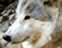

In [16]:
print("31px -> 62px")
inp = transform(Image.open(X64_valid_paths[4])).to(device)
with torch.inference_mode():
    out = (((model(inp[None])+1.0)/2.0).clamp(0.0, 1.0) * 255.0).squeeze()

img = Image.fromarray(out.permute(1, 2, 0).to(torch.uint8).cpu().numpy())
os.makedirs('../image_results/2X/31px', exist_ok=True)
img.save('../image_results/2X/31px/SRResNet_31px.png')
img

63px -> 126px


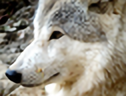

In [17]:
print("63px -> 126px")
inp = transform(Image.open(X32_valid_paths[4])).to(device)
with torch.inference_mode():
    out = (((model(inp[None])+1.0)/2.0).clamp(0.0, 1.0) * 255.0).squeeze()

img = Image.fromarray(out.permute(1, 2, 0).to(torch.uint8).cpu().numpy())
os.makedirs('../image_results/2X/63px', exist_ok=True)
img.save('../image_results/2X/63px/SRResNet_63px.png')
img

127px -> 254px


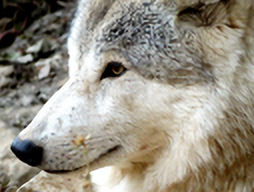

In [18]:
print("127px -> 254px")
inp = transform(Image.open(X16_valid_paths[4])).to(device)
with torch.inference_mode():
    out = (((model(inp[None])+1.0)/2.0).clamp(0.0, 1.0) * 255.0).squeeze()

img = Image.fromarray(out.permute(1, 2, 0).to(torch.uint8).cpu().numpy())
os.makedirs('../image_results/2X/127px', exist_ok=True)
img.save('../image_results/2X/127px/SRResNet_127px.png')
img

255px -> 510px


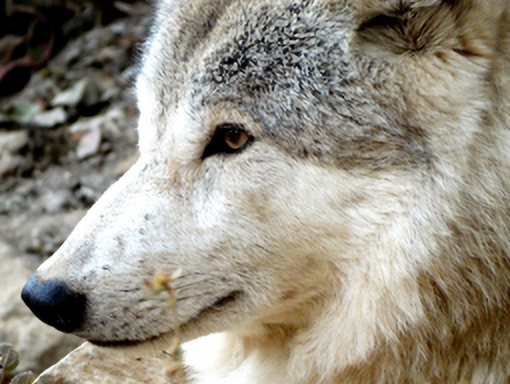

In [19]:
print("255px -> 510px")
inp = transform(Image.open(X8_valid_paths[4])).to(device)
with torch.inference_mode():
    out = (((model(inp[None])+1.0)/2.0).clamp(0.0, 1.0) * 255.0).squeeze()

img = Image.fromarray(out.permute(1, 2, 0).to(torch.uint8).cpu().numpy())
os.makedirs('../image_results/2X/255px', exist_ok=True)
img.save('../image_results/2X/255px/SRResNet_255px.png')
img

510px -> 1020px


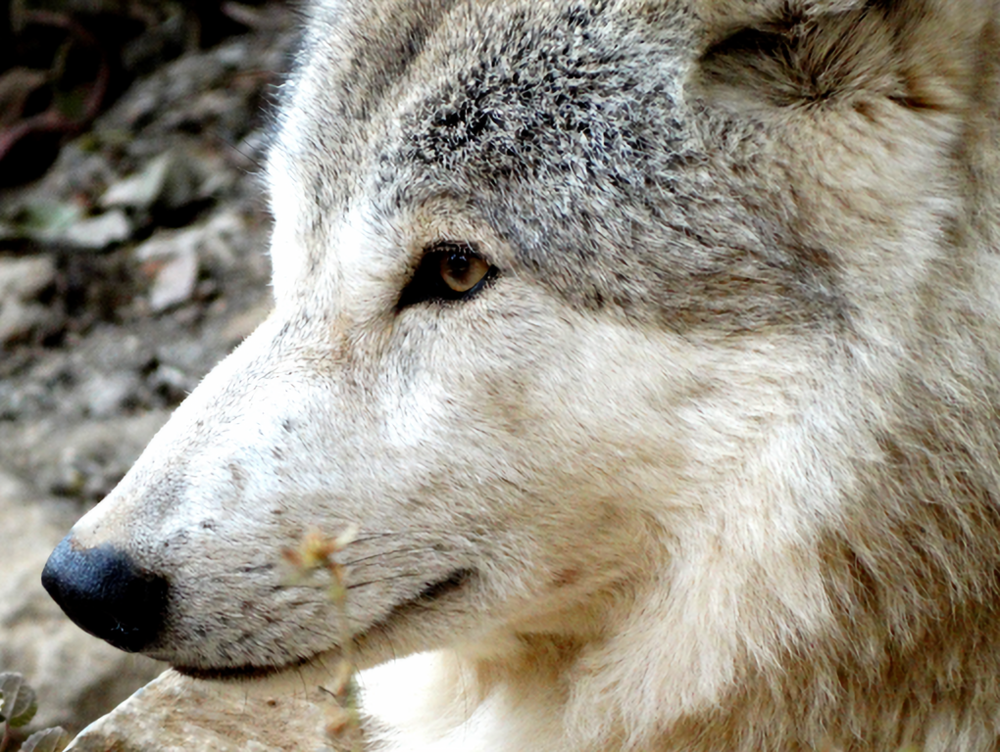

In [20]:
print("510px -> 1020px")
inp = transform(Image.open(X4_valid_paths[4])).to(device)
with torch.inference_mode():
    out = (((model(inp[None])+1.0)/2.0).clamp(0.0, 1.0) * 255.0).squeeze()

img = Image.fromarray(out.permute(1, 2, 0).to(torch.uint8).cpu().numpy())
os.makedirs('../image_results/2X/510px', exist_ok=True)
img.save('../image_results/2X/510px/SRResNet_510px.png')
img

1020px -> 2040px


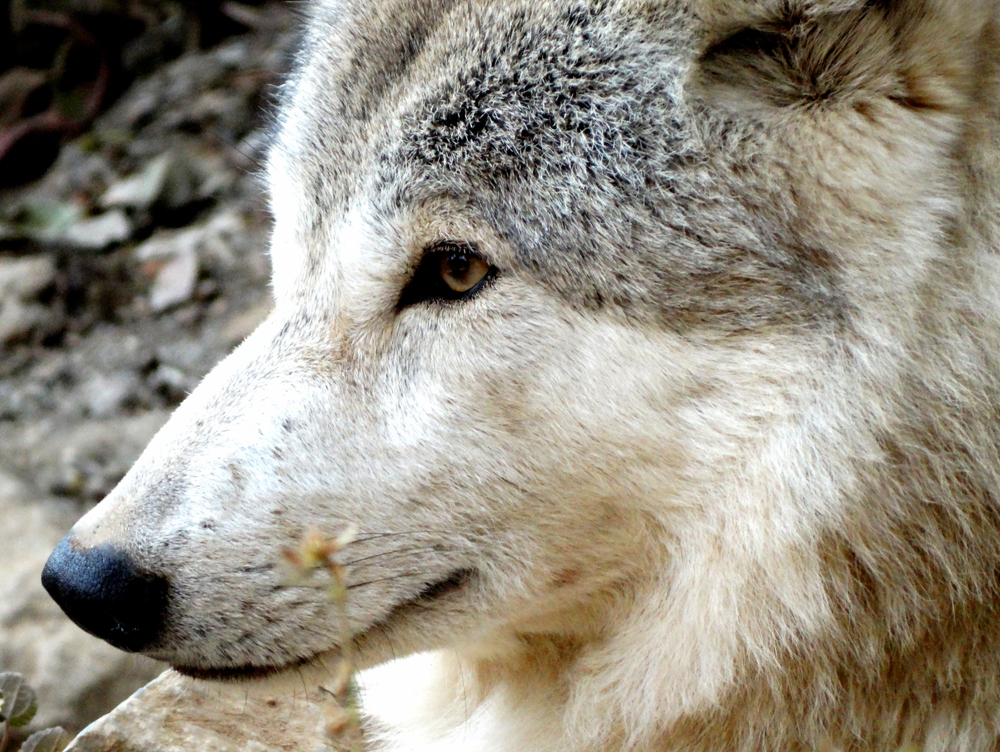

In [21]:
print("1020px -> 2040px")
inp = transform(Image.open(X2_valid_paths[4])).to(device)
with torch.inference_mode():
    out = (((model(inp[None])+1.0)/2.0).clamp(0.0, 1.0) * 255.0).squeeze()

img = Image.fromarray(out.permute(1, 2, 0).to(torch.uint8).cpu().numpy())
os.makedirs('../image_results/2X/1020px', exist_ok=True)
img.save('../image_results/2X/1020px/SRResNet_1020px.png')
img

### Day 2

In [13]:
train_dl = DataLoader(train_ds, batch_size=16, shuffle=True, num_workers=os.cpu_count()-1)
valid_dl = DataLoader(valid_ds, batch_size=16, shuffle=False, num_workers=os.cpu_count()-1)

checkpoint = torch.load('../tmp_model_checkpoints/last.pth')
model = SRResNet(2).to(device)
loss_fn = nn.L1Loss()
optimizer = Adam(model.parameters(), lr=1e-4)

model.load_state_dict(checkpoint['model_state_dict'])
optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
scheduler = StepLR(optimizer, step_size=4000, gamma=0.5)

train(model, train_dl, valid_dl, optimizer, scheduler, loss_fn, 20000, start_checkpoint=checkpoint)

Epochs:   0%|          | 0/10000 [00:00<?, ?it/s]

Epoch: 10100 | learning rate: 0.000025 | [train] PSNR: 31.5582 | [train] SSIM: 0.9174 | [valid] PSNR: 31.6258 | [valid] SSIM: 0.9258 | [valid] LPIPS: 0.0689
Epoch: 10200 | learning rate: 0.000025 | [train] PSNR: 31.7940 | [train] SSIM: 0.9195 | [valid] PSNR: 32.2992 | [valid] SSIM: 0.9360 | [valid] LPIPS: 0.0595
Epoch: 10300 | learning rate: 0.000025 | [train] PSNR: 31.9368 | [train] SSIM: 0.9215 | [valid] PSNR: 32.6147 | [valid] SSIM: 0.9421 | [valid] LPIPS: 0.0544
Epoch: 10400 | learning rate: 0.000025 | [train] PSNR: 31.8443 | [train] SSIM: 0.9197 | [valid] PSNR: 31.5837 | [valid] SSIM: 0.9345 | [valid] LPIPS: 0.0575
Epoch: 10456 | learning rate: 0.000025 | [train] PSNR: 32.0033 | [train] SSIM: 0.9198 | [valid] PSNR: 34.0949 | [valid] SSIM: 0.9492 | [valid] LPIPS: 0.0463
Epoch: 10556 | learning rate: 0.000025 | [train] PSNR: 32.1130 | [train] SSIM: 0.9235 | [valid] PSNR: 30.8111 | [valid] SSIM: 0.9207 | [valid] LPIPS: 0.0655
Epoch: 10656 | learning rate: 0.000025 | [train] PSNR: 31.

In [25]:
checkpoint = torch.load('../model_checkpoints/SRResNet/X2.pth')
model = SRResNet(2).to(device)
model.load_state_dict(checkpoint['model_state_dict'])

<All keys matched successfully>

In [26]:
model.eval();

In [27]:
targets = [X32_valid_paths, X16_valid_paths, X8_valid_paths, X4_valid_paths, X2_valid_paths, HR_valid_paths]

metrics_x2 = pd.DataFrame(columns=["PSNR↑", "SSIM↑", "LPIPS↓"])
for target_ds in tqdm(targets, total=6):
    metrics_x2.loc[len(metrics_x2)] = calc_metrics(model, target_ds, 2)

metrics_x2.index = [
    "31px -> 62px", "63px -> 126px", "127px -> 254px", 
    "255px -> 510px", "510px -> 1020px", "1020px -> 2040px"
]
metrics_x2

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

  0%|          | 0/100 [00:00<?, ?it/s]

,PSNR↑,SSIM↑,LPIPS↓
31px -> 62px,26.662233,0.879098,0.054308
63px -> 126px,27.917544,0.895056,0.080245
127px -> 254px,29.730202,0.917923,0.081397
255px -> 510px,31.295589,0.927820,0.079176
510px -> 1020px,33.236746,0.938645,0.077401
1020px -> 2040px,34.531631,0.936807,0.090742


#### Super-resolution showcase

31px -> 62px


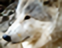

In [28]:
print("31px -> 62px")
inp = transform(Image.open(X64_valid_paths[4])).to(device)
with torch.inference_mode():
    out = (((model(inp[None])+1.0)/2.0).clamp(0.0, 1.0) * 255.0).squeeze()

img = Image.fromarray(out.permute(1, 2, 0).to(torch.uint8).cpu().numpy())
os.makedirs('../image_results/2X/31px', exist_ok=True)
img.save('../image_results/2X/31px/SRResNet_31px.png')
img

63px -> 126px


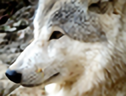

In [29]:
print("63px -> 126px")
inp = transform(Image.open(X32_valid_paths[4])).to(device)
with torch.inference_mode():
    out = (((model(inp[None])+1.0)/2.0).clamp(0.0, 1.0) * 255.0).squeeze()

img = Image.fromarray(out.permute(1, 2, 0).to(torch.uint8).cpu().numpy())
os.makedirs('../image_results/2X/63px', exist_ok=True)
img.save('../image_results/2X/63px/SRResNet_63px.png')
img

127px -> 254px


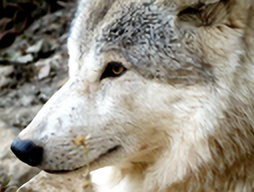

In [30]:
print("127px -> 254px")
inp = transform(Image.open(X16_valid_paths[4])).to(device)
with torch.inference_mode():
    out = (((model(inp[None])+1.0)/2.0).clamp(0.0, 1.0) * 255.0).squeeze()

img = Image.fromarray(out.permute(1, 2, 0).to(torch.uint8).cpu().numpy())
os.makedirs('../image_results/2X/127px', exist_ok=True)
img.save('../image_results/2X/127px/SRResNet_127px.png')
img

255px -> 510px


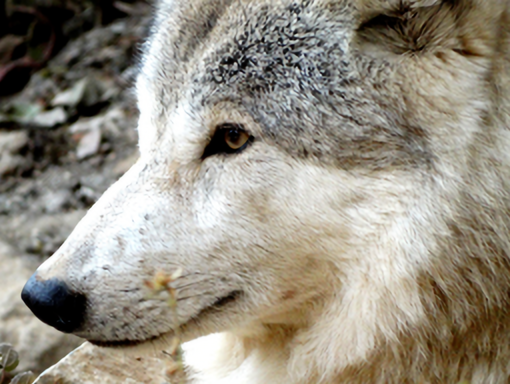

In [31]:
print("255px -> 510px")
inp = transform(Image.open(X8_valid_paths[4])).to(device)
with torch.inference_mode():
    out = (((model(inp[None])+1.0)/2.0).clamp(0.0, 1.0) * 255.0).squeeze()

img = Image.fromarray(out.permute(1, 2, 0).to(torch.uint8).cpu().numpy())
os.makedirs('../image_results/2X/255px', exist_ok=True)
img.save('../image_results/2X/255px/SRResNet_255px.png')
img

510px -> 1020px


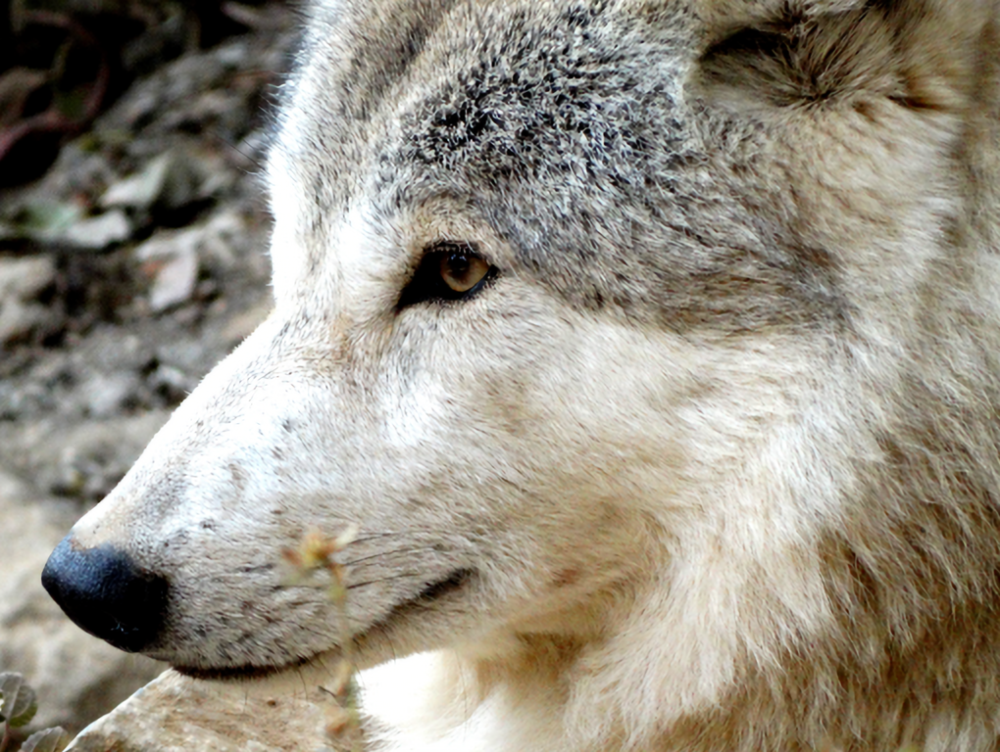

In [32]:
print("510px -> 1020px")
inp = transform(Image.open(X4_valid_paths[4])).to(device)
with torch.inference_mode():
    out = (((model(inp[None])+1.0)/2.0).clamp(0.0, 1.0) * 255.0).squeeze()

img = Image.fromarray(out.permute(1, 2, 0).to(torch.uint8).cpu().numpy())
os.makedirs('../image_results/2X/510px', exist_ok=True)
img.save('../image_results/2X/510px/SRResNet_510px.png')
img

1020px -> 2040px


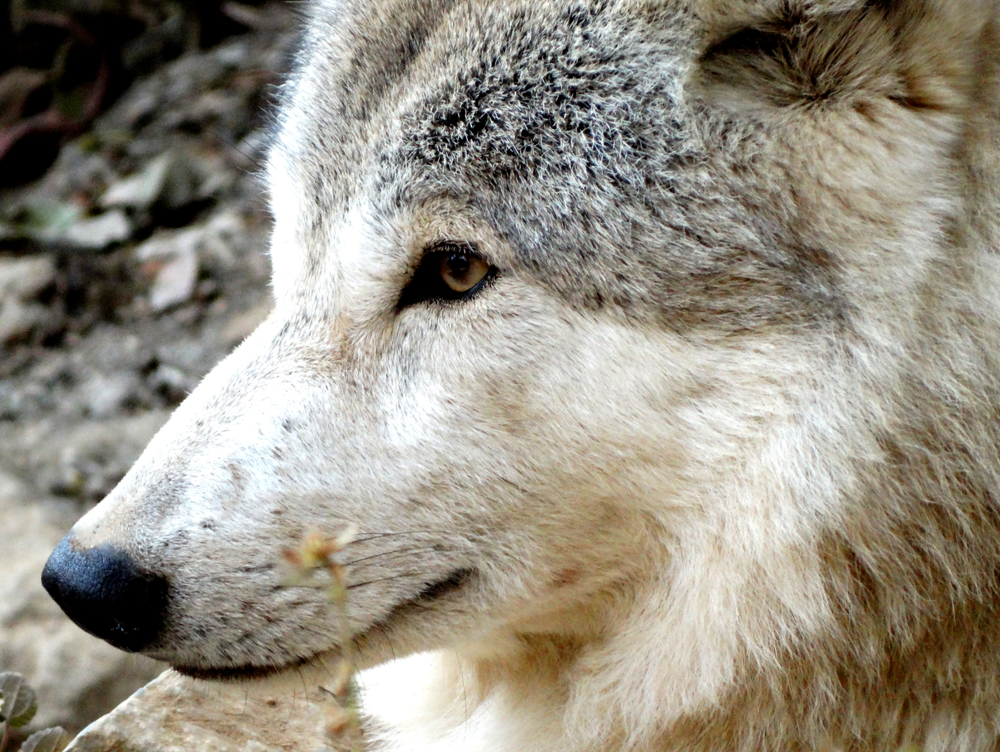

In [33]:
print("1020px -> 2040px")
inp = transform(Image.open(X2_valid_paths[4])).to(device)
with torch.inference_mode():
    out = (((model(inp[None])+1.0)/2.0).clamp(0.0, 1.0) * 255.0).squeeze()

img = Image.fromarray(out.permute(1, 2, 0).to(torch.uint8).cpu().numpy())
os.makedirs('../image_results/2X/1020px', exist_ok=True)
img.save('../image_results/2X/1020px/SRResNet_1020px.png')
img